In [4]:
conda install -c conda-forge scanpy

Solving environment: done

## Package Plan ##

  environment location: /opt/anaconda3

  added / updated specs:
    - scanpy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    anndata-0.8.0              |     pyhd8ed1ab_1          74 KB  conda-forge
    conda-22.9.0               |   py39h6e9494a_2         962 KB  conda-forge
    importlib-metadata-5.0.0   |     pyha770c72_1          23 KB  conda-forge
    importlib_metadata-5.0.0   |       hd8ed1ab_1           8 KB  conda-forge
    natsort-8.2.0              |     pyhd8ed1ab_0          36 KB  conda-forge
    networkx-2.8.8             |     pyhd8ed1ab_0         1.6 MB  conda-forge
    pandas-1.5.1               |   py39hecff1ad_1        12.4 MB  conda-forge
    patsy-0.5.3                |     pyhd8ed1ab_0         189 KB  conda-forge
    pynndescent-0.5.8          |     pyh1a96a4e_0          47 KB  conda-forge
    scanpy-1.9.1           

In [63]:
pip install python-igraph

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.5 MB/s eta 0:00:0000:010:01
  Created wheel for python-igraph: filename=python_igraph-0.10.2-py3-none-any.whl size=9073 sha256=afc9bb0107f2b99269aec8ffd172e1f4539143ce587f439d4b311cce48ff45fe
  Stored in directory: /Users/reziw3/Library/Caches/pip/wheels/4c/35/1d/11bb895ade10b4da7d78b77b3ed81b10155d6b450c74f83647
Successfully built python-igraph
Note: you may need to restart the kernel to use updated packages.


In [6]:
import matplotlib.pyplot as plt

In [7]:
import os
os.getcwd()

'/Volumes/takebelab/Hasan/1sn'

In [5]:
os.chdir('/Volumes/takebelab/Hasan/1sn/')

In [1]:
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd

In [9]:
X = io.mmread("./HCLO/counts.mtx")

In [10]:
adata = anndata.AnnData(
    X=X.transpose().tocsr())

/var/folders/hq/mt_9wjp90cx45qsgnk3d7qfc0000gq/T/ipykernel_33796/1892404302.py:1: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(


In [11]:
cell_meta = pd.read_csv("./HCLO/metadata.csv")

In [12]:
with open("./HCLO/gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

In [13]:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

In [14]:
pca = pd.read_csv("./HCLO/pca.csv")
pca.index = adata.obs.index

In [15]:
adata.obsm['X_pca'] = pca.to_numpy()

In [16]:
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

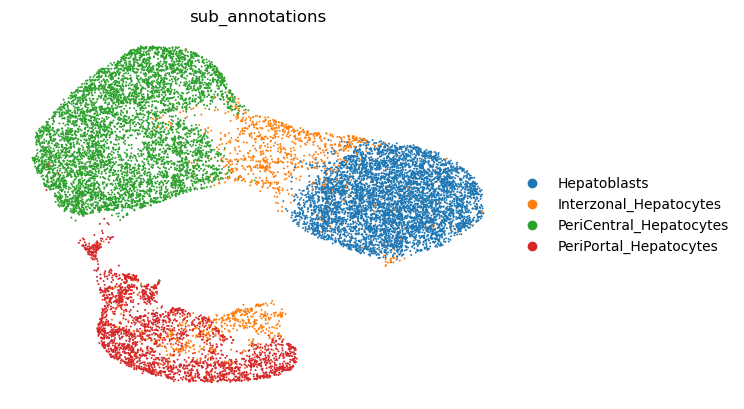

In [17]:
sc.pl.umap(adata, color='sub_annotations', frameon=False, save=True)

In [18]:
adata.write('my_data.h5ad')

In [19]:
adata = sc.read_h5ad('my_data.h5ad')

In [20]:
pip install git+https://github.com/theislab/scvelo@develop

  Cloning https://github.com/theislab/scvelo (to revision develop) to /private/var/folders/hq/mt_9wjp90cx45qsgnk3d7qfc0000gq/T/pip-req-build-y9x6_kpb
  Running command git clone --filter=blob:none --quiet https://github.com/theislab/scvelo /private/var/folders/hq/mt_9wjp90cx45qsgnk3d7qfc0000gq/T/pip-req-build-y9x6_kpb
  Running command git checkout -b develop --track origin/develop
  Switched to a new branch 'develop'
  Branch 'develop' set up to track remote branch 'develop' from 'origin'.
  Resolved https://github.com/theislab/scvelo to commit bc73300c8046b8ec47a0a484f77920d919dbac47
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Note: you may need to restart the kernel to use updated packages.


In [20]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

In [21]:
conda install -c conda-forge -c bioconda cellrank

Solving environment: done

## Package Plan ##

  environment location: /opt/anaconda3

  added / updated specs:
    - cellrank


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    cellrank-1.5.1             |     pyhdfd78af_0         160 KB  bioconda
    docrep-0.3.2               |     pyh44b312d_0          19 KB  conda-forge
    fftw-3.3.10                |mpi_mpich_h4a8b384_5         1.9 MB  conda-forge
    h5py-3.7.0                 |nompi_py39h7d40783_102         1.1 MB  conda-forge
    hdf5-1.12.2                |mpi_mpich_h9807619_0         4.0 MB  conda-forge
    hypre-2.26.0               |mpi_mpich_h5eb2ec2_0         2.0 MB  conda-forge
    loompy-3.0.6               |             py_0          40 KB  conda-forge
    metis-5.1.0                |    h2e338ed_1006         4.1 MB  conda-forge
    mpi-1.0                    |            mpich           4 KB  conda-forge
    mpi4py-3.1

In [21]:
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
cr.settings.verbosity = 2

In [22]:
adata = sc.read_h5ad('my_data.h5ad')

In [23]:
ldata1 = scv.read('./HCLO/velocyto/HCLO.loom', cache=True)

/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [24]:
barcodes = [bc.split(':')[1] for bc in ldata1.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_10' for bc in barcodes]
ldata1.obs.index = barcodes

In [25]:
ldata1.var_names_make_unique()

In [26]:
adata = scv.utils.merge(adata, ldata1)

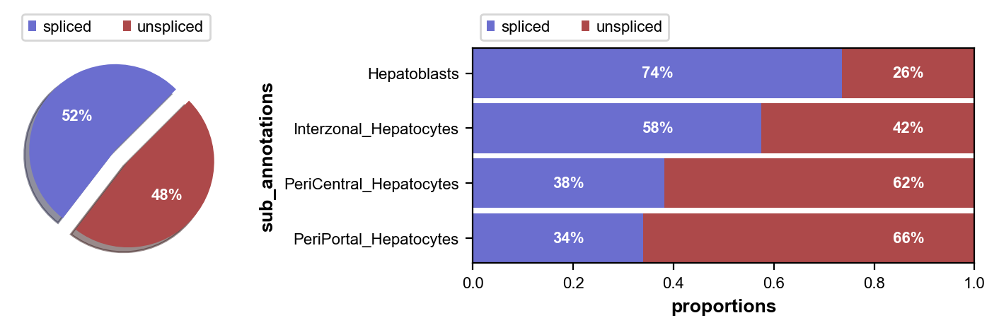

In [27]:
scv.pl.proportions(adata, groupby='sub_annotations')

In [28]:
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:22) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:13) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [29]:
scv.tl.velocity(adata, mode='stochastic')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:01:12) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/4 cores)


  0%|          | 0/14884 [00:00<?, ?cells/s]

/opt/anaconda3/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:57) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_embedding.pdf


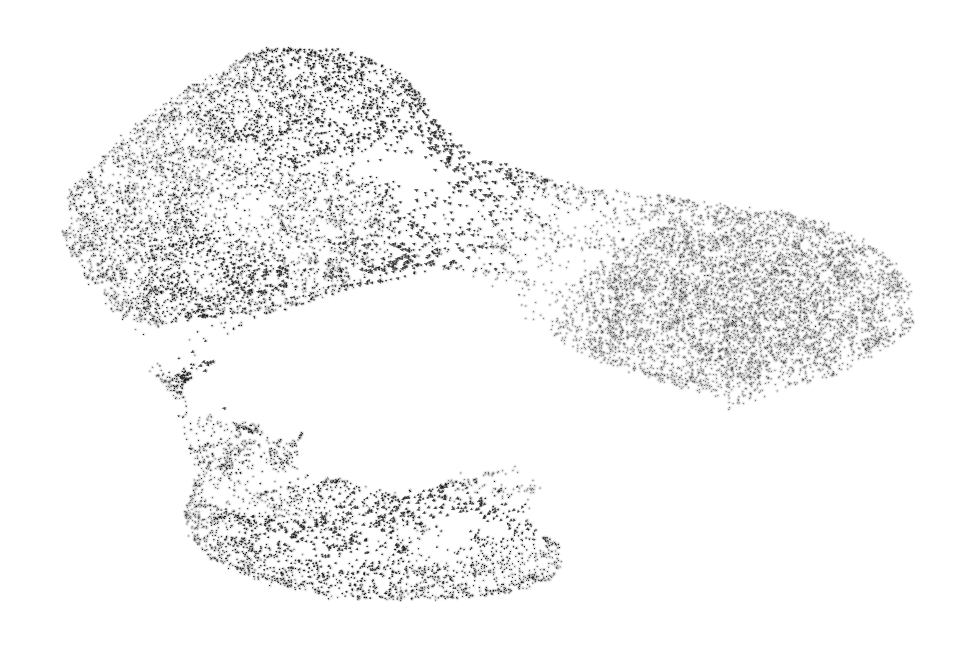

In [30]:
scv.pl.velocity_embedding(adata, basis='umap', frameon=False, save='embedding.pdf')

saving figure to file ./figures/scvelo_embedding_grid.png


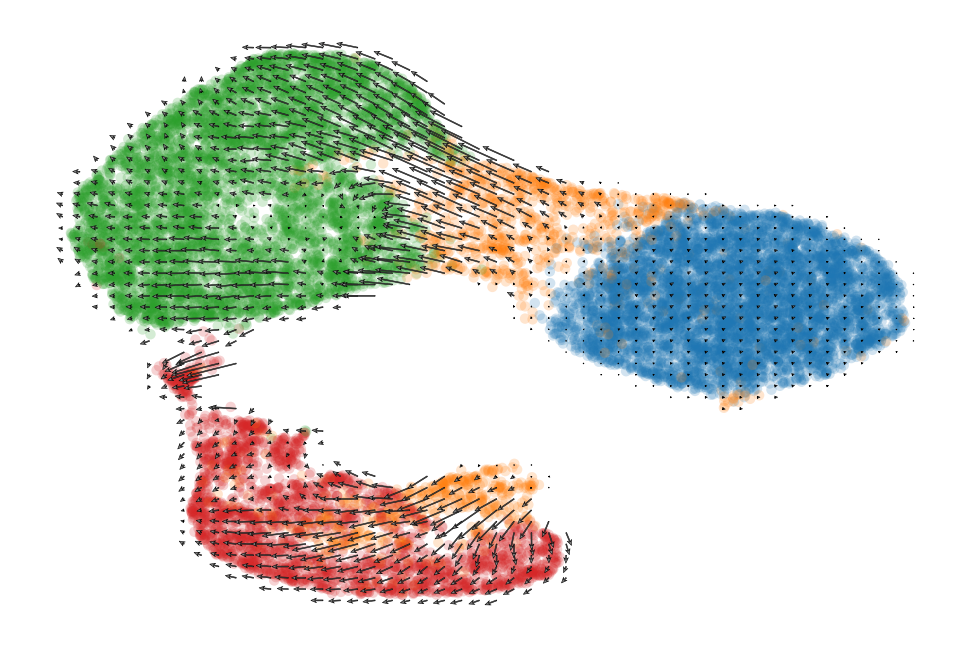

In [31]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='sub_annotations', save='embedding_grid.png', title='', scale=0.25)

In [32]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
# rc('font',**{'family':'serif','serif':['Arial']})
# rc('text', usetex=True)

saving figure to file ./figures/scvelo_embedding_stream2.png


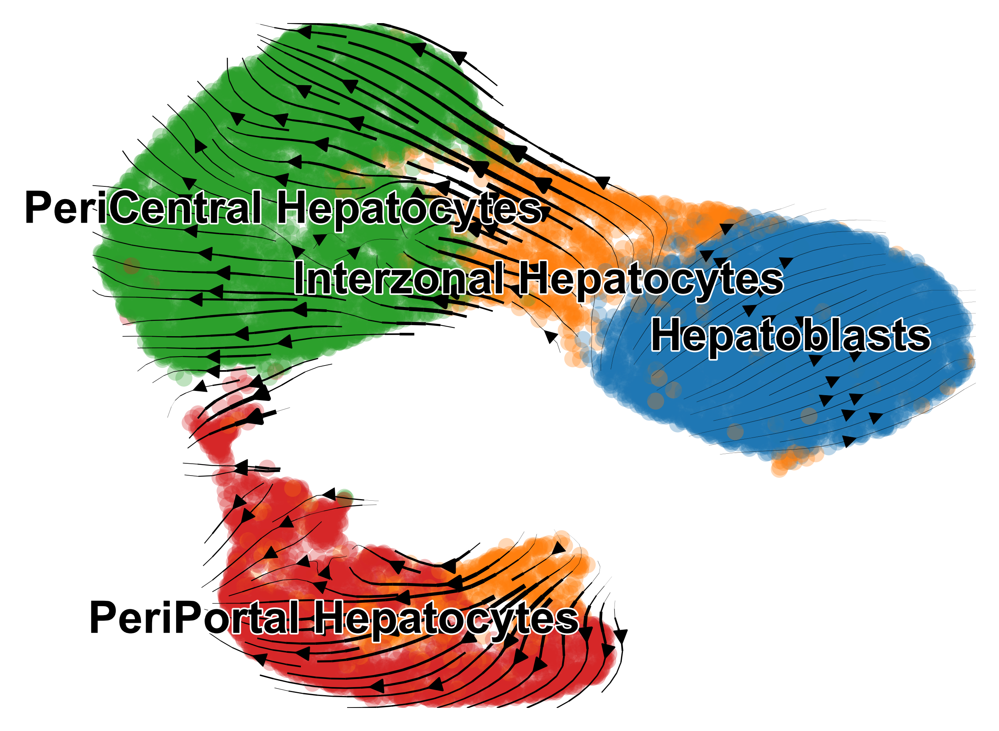

In [33]:
plt.rcParams.update({'font.family': "Arial"})
plt.rcParams.update({'font.size': 14})
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['sub_annotations'], save='embedding_stream2.png', title='', figsize=(4.9, 3.9), dpi=300,)

In [97]:
plt.savefig('destination_path.eps', format='eps')

<Figure size 600x400 with 0 Axes>

saving figure to file ./figures/scvelo_AFP_velocity.png


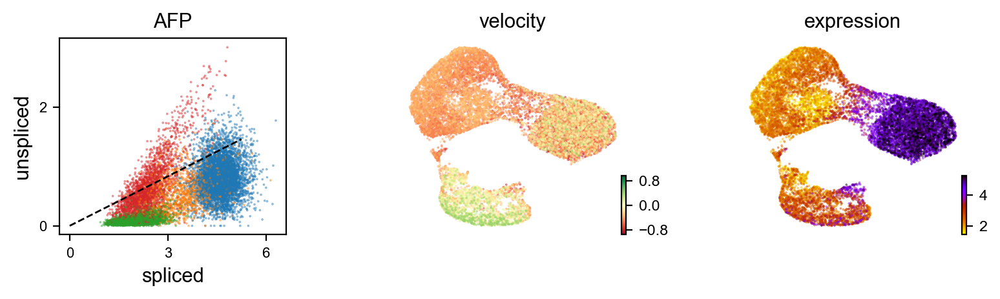

In [34]:
scv.pl.velocity(adata, var_names=['AFP'], color='sub_annotations',save='AFP_velocity.png')

In [35]:
scv.tl.rank_velocity_genes(adata, groupby='sub_annotations', min_corr=.3)

ranking velocity genes
    finished (0:02:14) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [36]:
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

,Hepatoblasts,Interzonal_Hepatocytes,PeriCentral_Hepatocytes,PeriPortal_Hepatocytes
0,RPS3,NR5A2,MEIS2,LRAT
1,RPL5,AC019117.2,HMGA2,NR5A2
2,TTR,AC019117.1,ARHGAP28,A1CF
3,RPL30,PDE5A,POSTN,PRDM1
4,RPL38,CACNA2D1,COL11A1,EFNB2


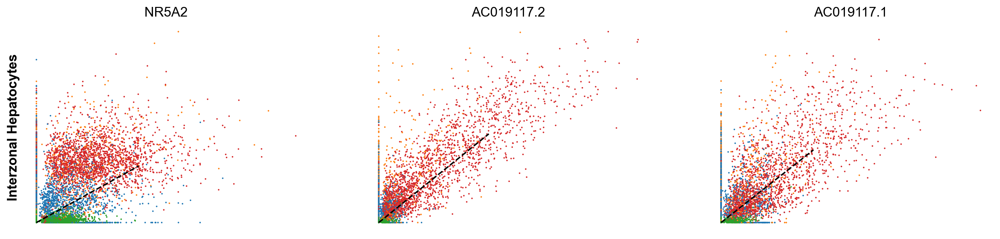

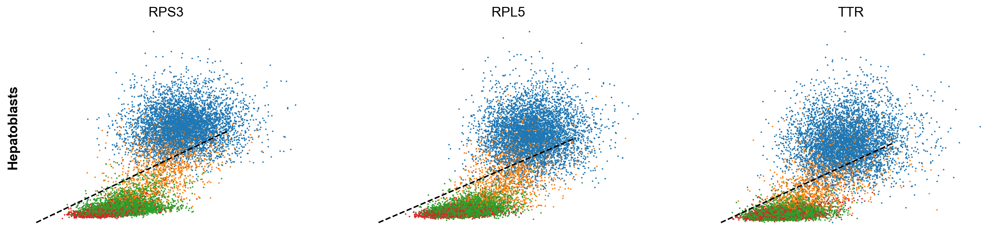

In [37]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='Hepatoblasts, Interzonal_Hepatocytes')

scv.pl.scatter(adata, df['Interzonal_Hepatocytes'][:3], ylabel='Interzonal_Hepatocytes', frameon=False, color='sub_annotations', size=10, linewidth=1.5)
scv.pl.scatter(adata, df['Hepatoblasts'][:3], ylabel='Hepatoblasts', frameon=False, color='sub_annotations', size=10, linewidth=1.5)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


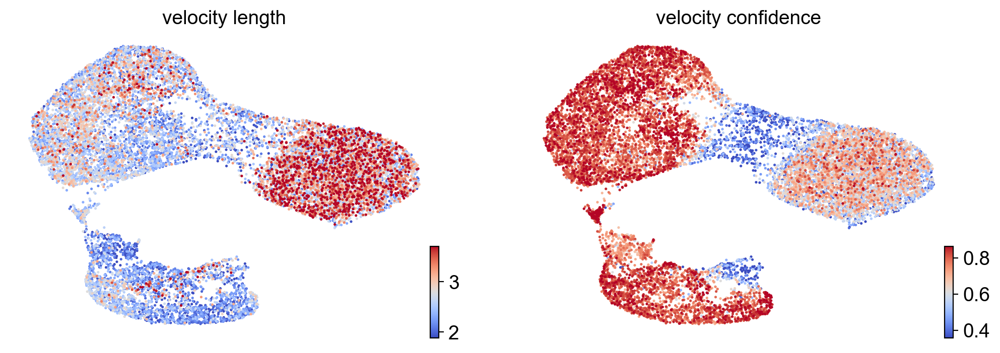

In [38]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

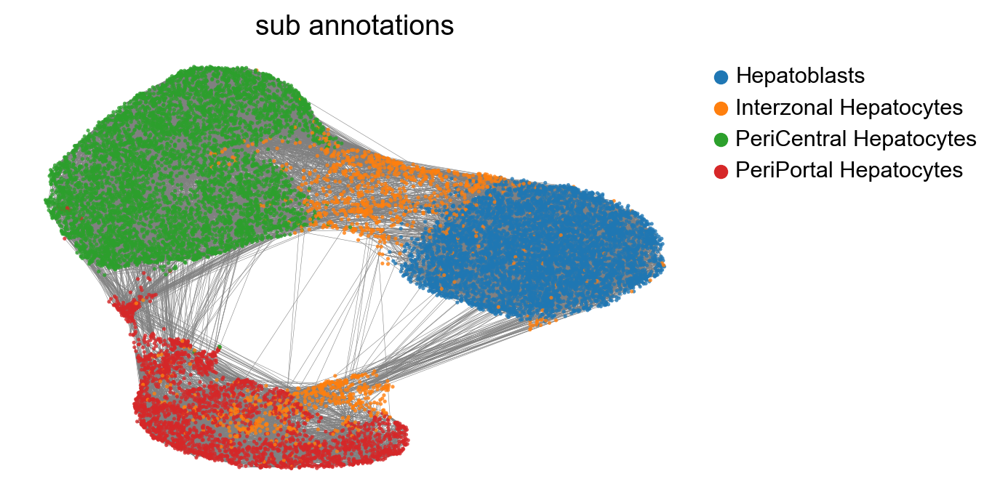

In [39]:
scv.pl.velocity_graph(adata, threshold=.5, color='sub_annotations')

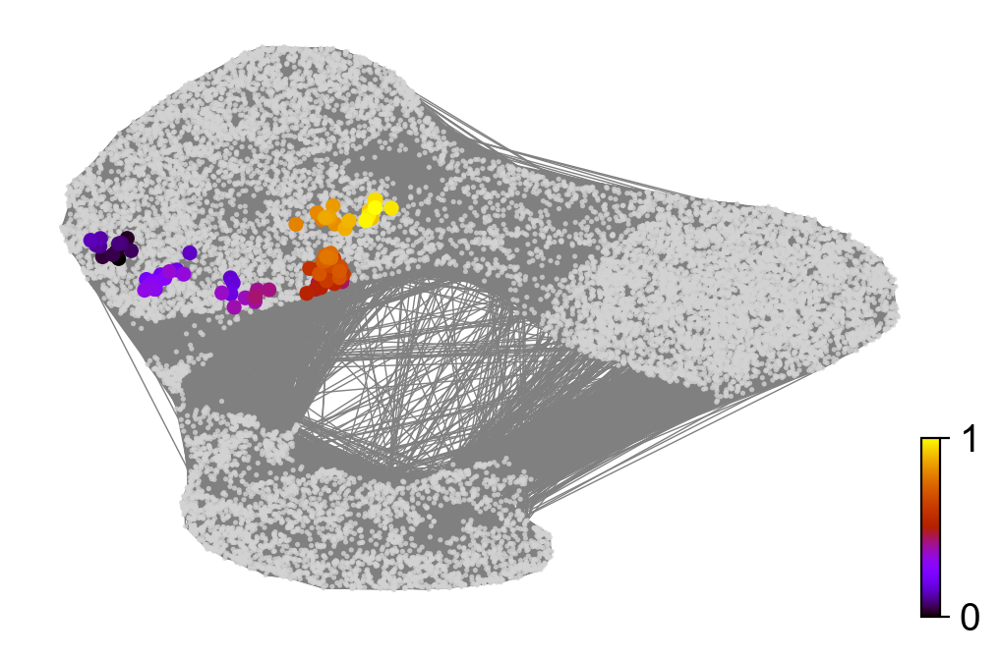

In [56]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.5, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

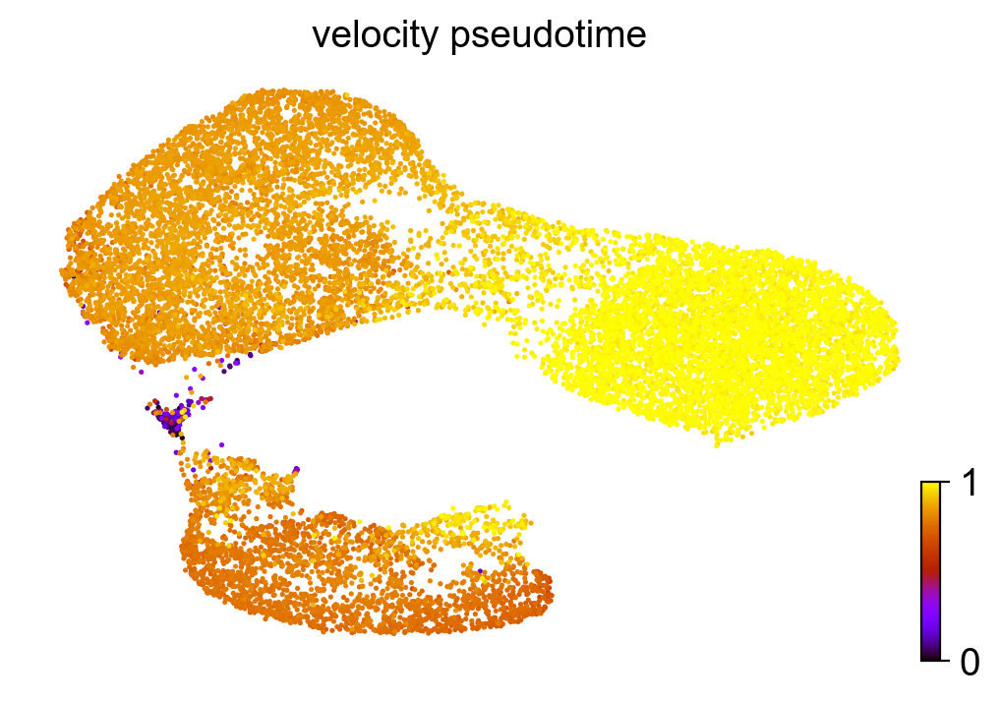

In [57]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [47]:
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

In [52]:
scv.tl.paga(adata, groups='sub_annotations')
df = scv.get_df(adata, 'paga/transitions_confidence').T

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:04) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


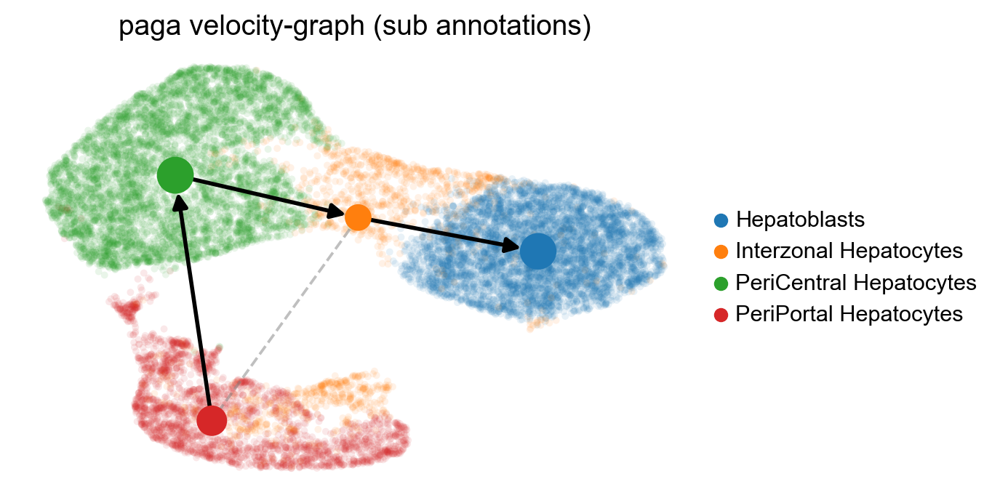

In [55]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

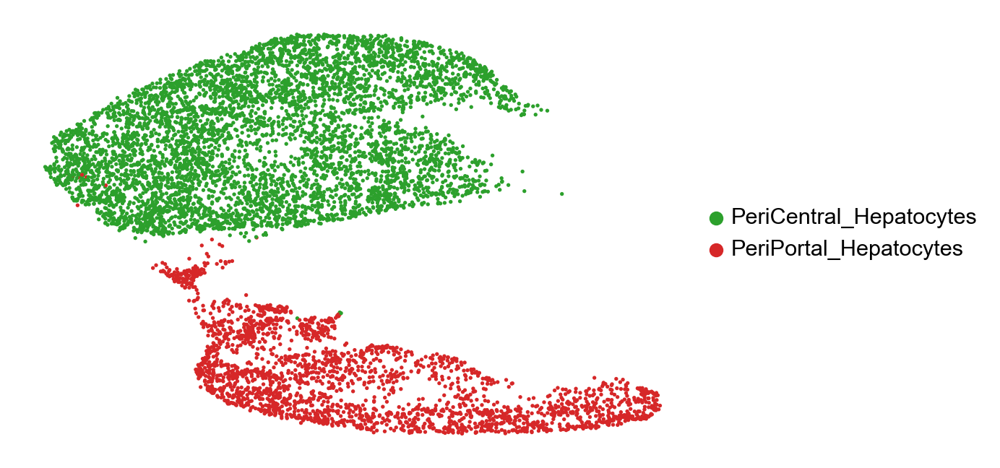

In [75]:
cur_celltypes = ['PeriCentral_Hepatocytes', 'PeriPortal_Hepatocytes']
adata_subset = adata[adata.obs['sub_annotations'].isin(cur_celltypes)]
sc.pl.umap(adata_subset, color=['sub_annotations'], frameon=False, title=['', ''])


In [76]:
sc.pp.neighbors(adata_subset, n_neighbors=15, use_rep='X_pca')

In [77]:
scv.pp.filter_and_normalize(adata_subset)
scv.pp.moments(adata_subset)

computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [78]:
scv.tl.recover_dynamics(adata_subset)

recovering dynamics (using 1/4 cores)


  0%|          | 0/430 [00:00<?, ?gene/s]

    finished (0:04:54) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/opt/anaconda3/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/opt/anaconda3/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [79]:
scv.tl.velocity(adata_subset, mode='dynamical')
scv.tl.velocity_graph(adata_subset)

computing velocities
    finished (0:00:29) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/4 cores)


  0%|          | 0/8113 [00:00<?, ?cells/s]

/opt/anaconda3/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_embedding_stream.png


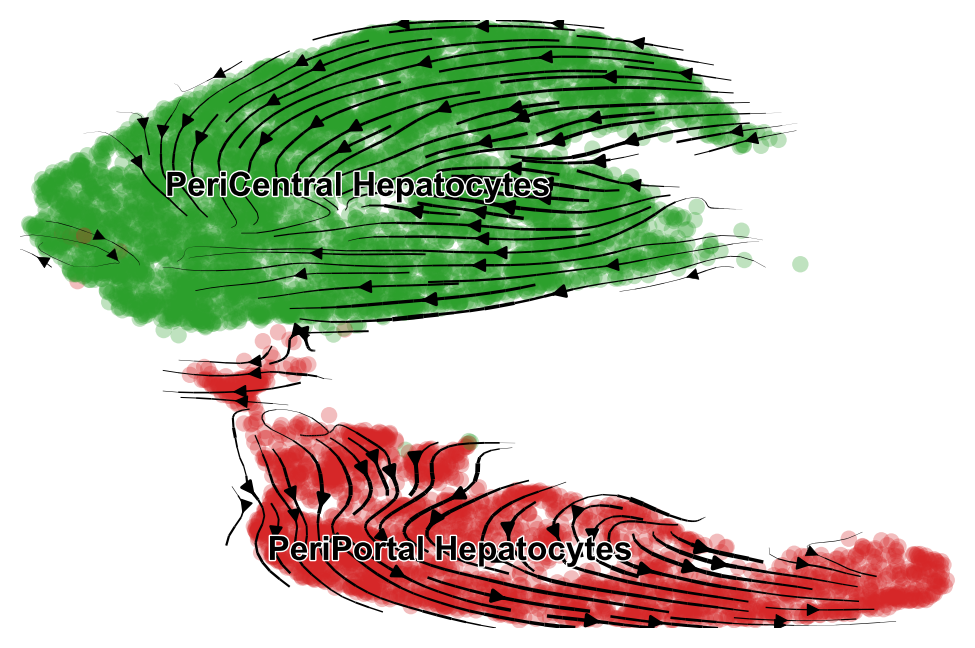

In [80]:
scv.pl.velocity_embedding_stream(adata_subset, basis='umap', color=['sub_annotations'], save='embedding_stream.pdf', title='')

In [81]:
df = adata_subset.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

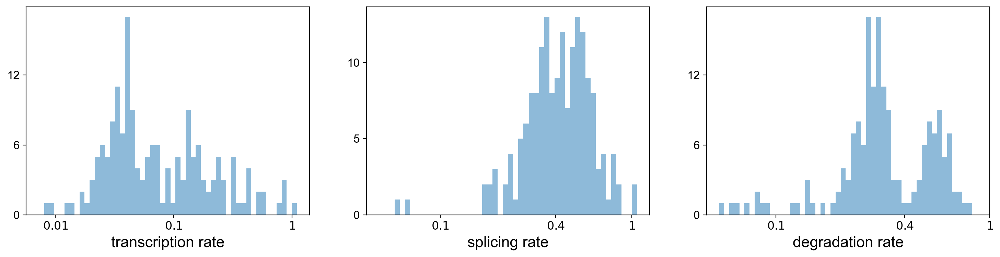

In [82]:
kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

In [83]:
scv.get_df(adata_subset, 'fit*', dropna=True).head()

/opt/anaconda3/lib/python3.9/site-packages/scvelo/core/_anndata.py:311: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
MIR34AHG,0.020650,0.257378,0.198613,9.608134,2.124687,0.036722,0.022180,0.221416,0.0,0.0,0.015391,0.093228,0.064300,0.984837,2.587325,0.229900
RHCE,0.003808,0.254097,0.175085,13.673913,0.910690,0.003842,0.004922,0.009087,0.0,0.0,0.010744,0.010735,0.014940,1.614101,5.293787,-0.109868
AL031280.1,0.024097,0.563880,0.236589,6.365261,1.884392,0.017748,0.016059,0.157778,0.0,0.0,0.043054,0.052945,0.053545,1.058040,1.644712,0.174785
KIF2C,0.055587,0.502137,0.312351,6.025438,0.959845,0.030227,0.039863,0.148312,0.0,0.0,0.328159,0.104579,0.120861,1.390575,2.251161,0.500289
ELAVL4,0.004594,0.179788,0.051677,44.938208,0.454044,0.006876,0.014083,0.028628,0.0,0.0,0.162626,0.023889,0.041143,2.102382,13.291442,0.017684


computing latent time using root_cells as prior
    finished (0:00:14) --> added 
    'latent_time', shared time (adata.obs)


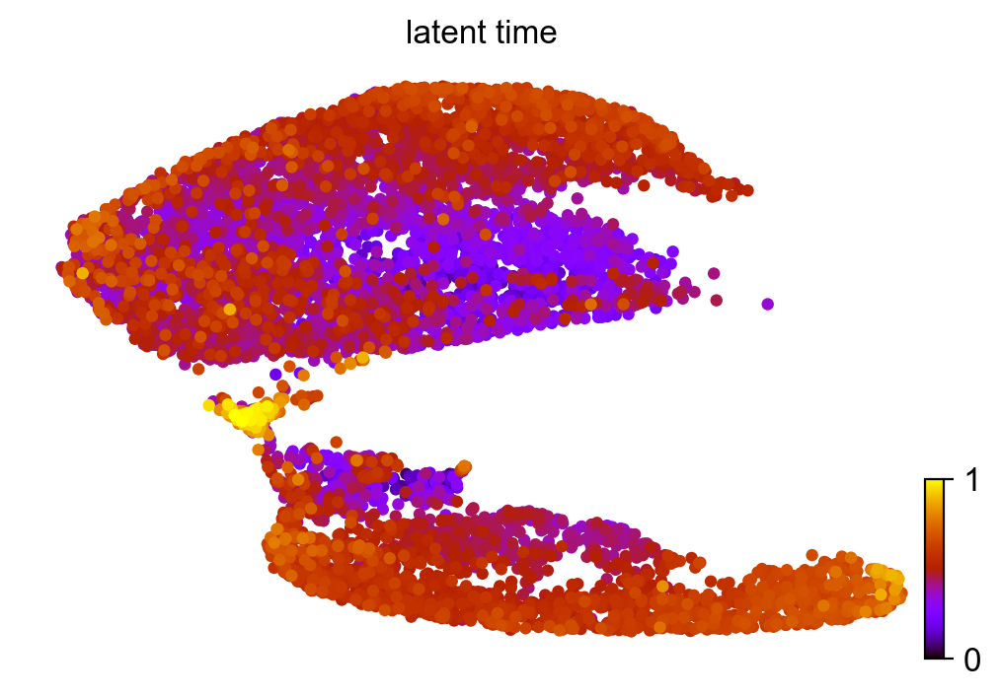

In [84]:
scv.tl.latent_time(adata_subset)
scv.pl.scatter(adata_subset, color='latent_time', color_map='gnuplot', size=80)

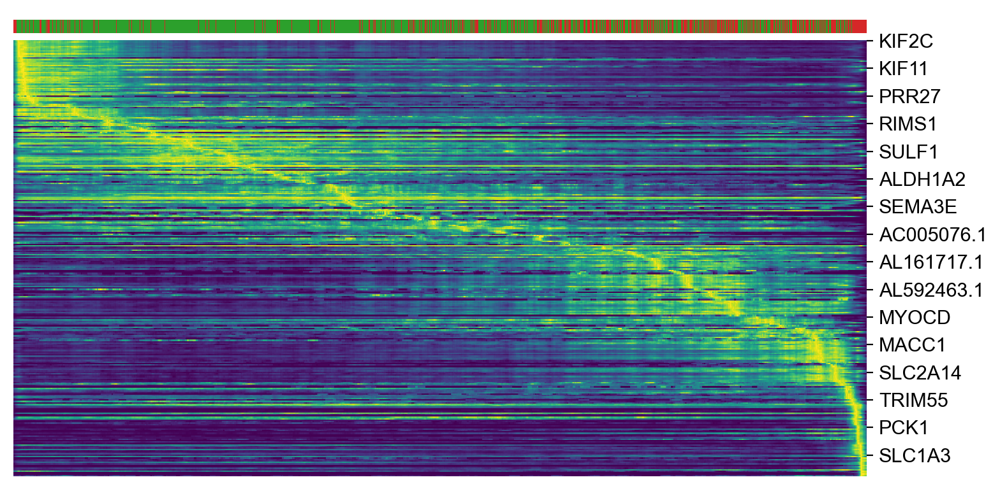

In [85]:
top_genes = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_subset, var_names=top_genes, sortby='latent_time', col_color='sub_annotations', n_convolve=100)

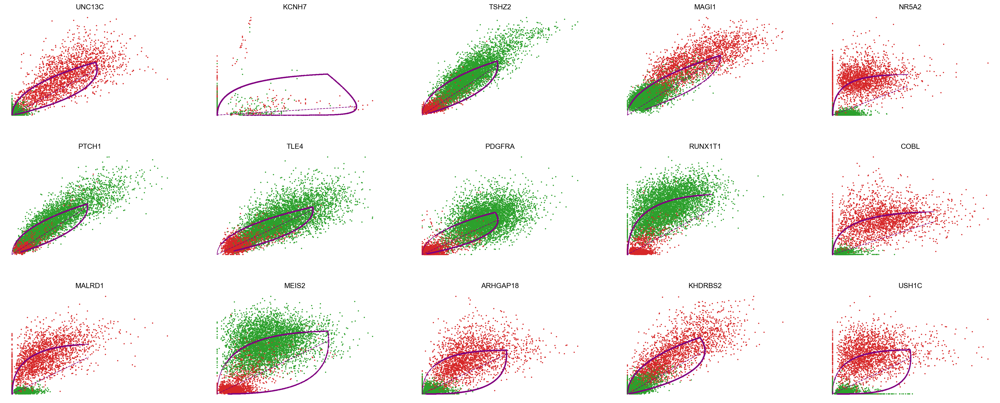

In [86]:
top_genes = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_subset, color='sub_annotations', basis=top_genes[:15], ncols=5, frameon=False)

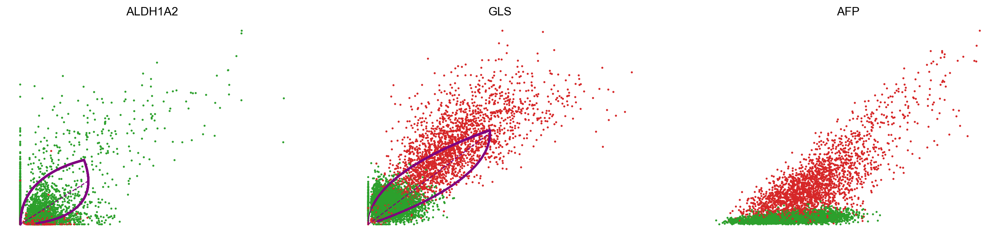

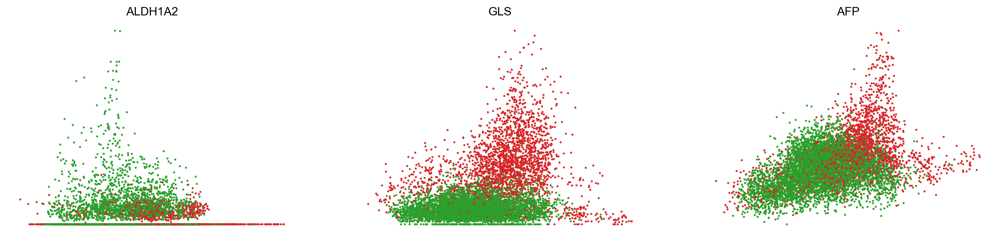

In [105]:
var_names = ['ALDH1A2', 'GLS', 'AFP']
scv.pl.scatter(adata_subset, var_names, color='sub_annotations', frameon=False)
scv.pl.scatter(adata_subset, x='latent_time', y=var_names, color='sub_annotations', frameon=False)

In [90]:
df

,Hepatoblasts,Interzonal_Hepatocytes,PeriCentral_Hepatocytes,PeriPortal_Hepatocytes
0,RPS3,NR5A2,MEIS2,LRAT
1,RPL5,AC019117.2,HMGA2,NR5A2
2,TTR,AC019117.1,ARHGAP28,A1CF
3,RPL30,PDE5A,POSTN,PRDM1
4,RPL38,CACNA2D1,COL11A1,EFNB2
...,...,...,...,...
95,AP005210.2,PFKFB4,AL138689.2,ITGA8
96,AC068931.1,NAV3,EPHA7,SLIT2
97,CREB5,ZFHX4,PHKA2,FENDRR
98,EBF1,TTR,SULT1E1,FSTL5


In [60]:
view(adata)


NameError: name 'view' is not defined